In [1]:
import numpy as np
import scipy
import scipy.io
import matplotlib.pyplot as plt


# Load the vivo dataset
vivo_path = 'exp/datasets/anes_data/vivo/data.mat'
vivo_data = scipy.io.loadmat(vivo_path)

# Extract keys and their shapes
vivo_summary = {k: v.shape for k, v in vivo_data.items() if isinstance(v, np.ndarray)}
vivo_summary


{'PSF_estim': (21, 11), 'bmode': (401, 200), 'rf': (401, 200)}

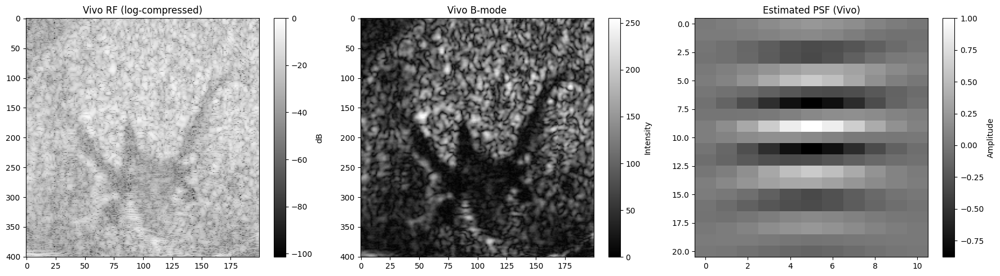

In [2]:
# Extract the data arrays
rf_vivo = vivo_data["rf"]
bmode_vivo = vivo_data["bmode"]
psf_vivo = vivo_data["PSF_estim"]

# Plot all three side-by-side
plt.figure(figsize=(18, 5))

# Plot RF (log-compressed)
plt.subplot(1, 3, 1)
rf_log = 20 * np.log10(np.abs(rf_vivo) / np.max(np.abs(rf_vivo)) + 1e-6)
plt.imshow(rf_log, cmap='gray', aspect='auto')
plt.title("Vivo RF (log-compressed)")
plt.colorbar(label='dB')

# Plot B-mode
plt.subplot(1, 3, 2)
plt.imshow(bmode_vivo, cmap='gray', aspect='auto')
plt.title("Vivo B-mode")
plt.colorbar(label='Intensity')

# Plot PSF
plt.subplot(1, 3, 3)
plt.imshow(psf_vivo, cmap='gray', aspect='auto')
plt.title("Estimated PSF (Vivo)")
plt.colorbar(label='Amplitude')

plt.tight_layout()
plt.show()


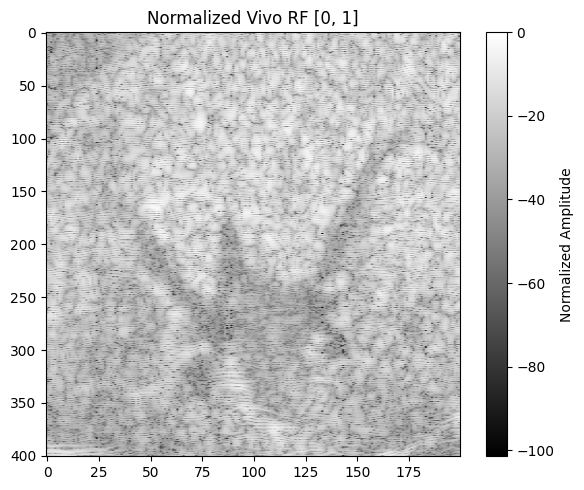

In [3]:
# Normalize RF to [0, 1]
rf_vivo_min = rf_vivo.min()
rf_vivo_max = rf_vivo.max()
rf_vivo_norm = (rf_vivo - rf_vivo_min) / (rf_vivo_max - rf_vivo_min + 1e-8)

# Visualize normalized RF
plt.figure(figsize=(6, 5))

plt.imshow(rf_log, cmap='gray', aspect='auto')
plt.title("Normalized Vivo RF [0, 1]")
plt.colorbar(label='Normalized Amplitude')
plt.tight_layout()
plt.show()


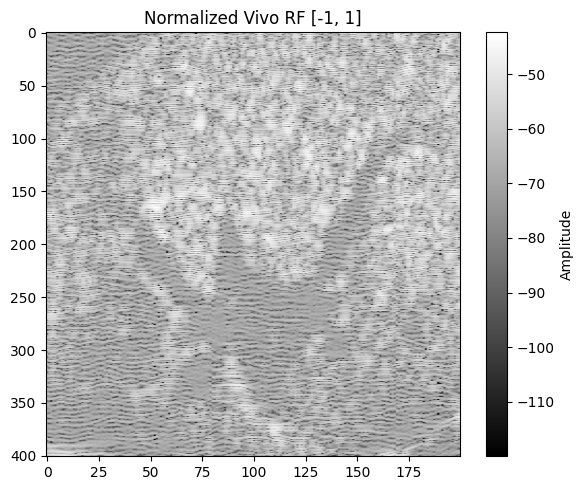

In [4]:
# Normalize RF to [-1, 1]
rf_vivo_norm_signed = 2 * ((rf_vivo - rf_vivo_min) / (rf_vivo_max - rf_vivo_min + 1e-8)) - 1

# Visualize normalized RF [-1, 1]
plt.figure(figsize=(6, 5))
rf_log = 20 * np.log10(np.abs(rf_vivo_norm_signed) / np.max(np.abs(rf_vivo)) + 1e-6)
plt.imshow(rf_log, cmap='gray', aspect='auto')
plt.title("Normalized Vivo RF [-1, 1]")
plt.colorbar(label='Amplitude')
plt.tight_layout()
plt.show()


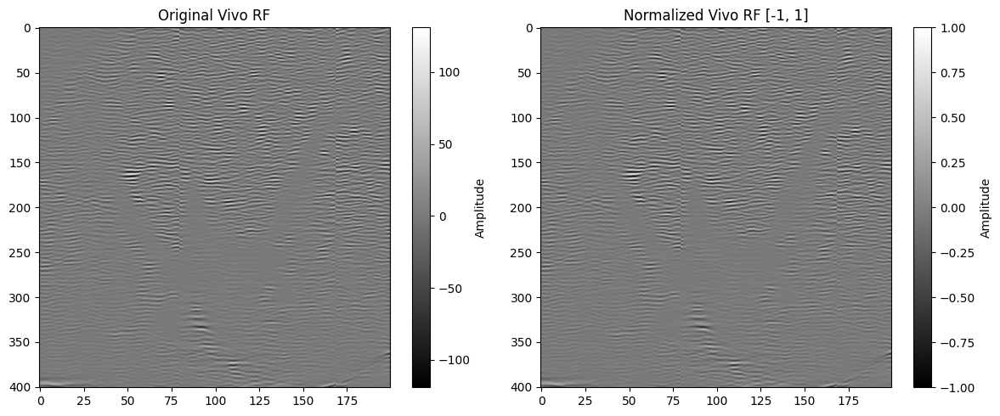

In [5]:
# Visualize original and [-1, 1] normalized RF side-by-side
plt.figure(figsize=(12, 5))

# Original RF
plt.subplot(1, 2, 1)
plt.imshow(rf_vivo, cmap='gray', aspect='auto')
plt.title("Original Vivo RF")
plt.colorbar(label='Amplitude')

# Normalized RF [-1, 1]
plt.subplot(1, 2, 2)
plt.imshow(rf_vivo_norm_signed, cmap='gray', aspect='auto')
plt.title("Normalized Vivo RF [-1, 1]")
plt.colorbar(label='Amplitude')

plt.tight_layout()
plt.show()


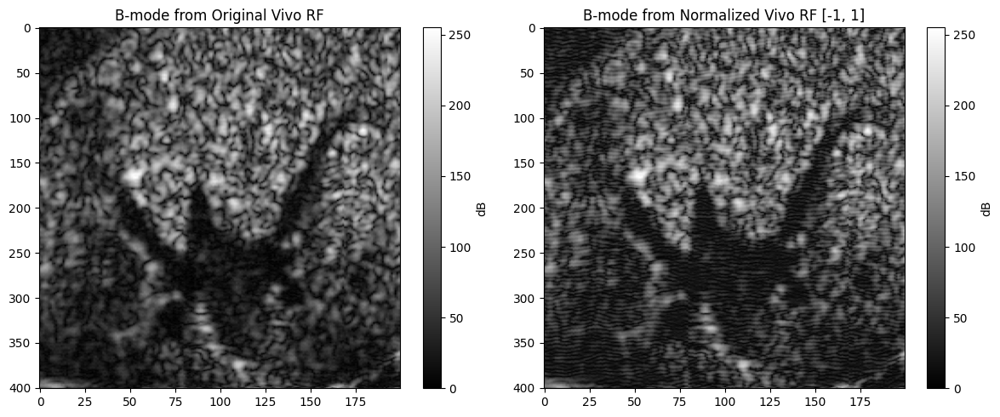

In [6]:
# === 1. Imports ===
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from numpy.fft import fft2, ifft2
from scipy.signal import hilbert
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
from skimage.exposure import match_histograms

# === 4. RF-to-B-mode conversion ===
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)
    
# Convert both original and normalized RF to B-mode
bmode_vivo_original = rf_to_matched_bmode(rf_vivo, bmode_vivo)
bmode_vivo_normed = rf_to_matched_bmode(rf_vivo_norm_signed, bmode_vivo)

# Visualize both B-mode images
plt.figure(figsize=(12, 5))

# B-mode from original RF
plt.subplot(1, 2, 1)
plt.imshow(bmode_vivo_original, cmap='gray', aspect='auto')
plt.title("B-mode from Original Vivo RF")
plt.colorbar(label='dB')

# B-mode from normalized RF [-1, 1]
plt.subplot(1, 2, 2)
plt.imshow(bmode_vivo_normed, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized Vivo RF [-1, 1]")
plt.colorbar(label='dB')

plt.tight_layout()
plt.show()


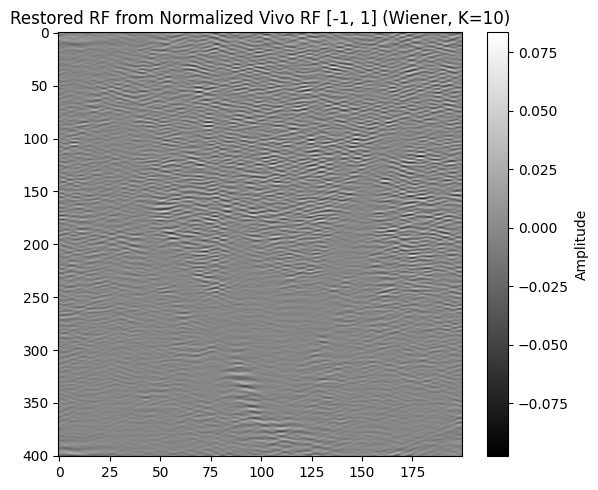

In [7]:
# Define and run Wiener deconvolution with K = 8 on normalized RF
def wiener_deconvolution(y: np.ndarray, psf: np.ndarray, K: float = 0.01) -> np.ndarray:
    H, W = y.shape
    Mh, Nh = psf.shape

    # Zero-pad and center PSF
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    # FFTs
    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)

    # Wiener filter
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft

    # Inverse FFT
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# Apply Wiener deconvolution with K = 8
restored_rf_vivo_norm_wiener = wiener_deconvolution(rf_vivo_norm_signed, psf_vivo, K=8)

# Visualize the restored RF
plt.figure(figsize=(6, 5))
plt.imshow(restored_rf_vivo_norm_wiener, cmap='gray', aspect='auto')
plt.title("Restored RF from Normalized Vivo RF [-1, 1] (Wiener, K=10)")
plt.colorbar(label='Amplitude')
plt.tight_layout()
plt.show()


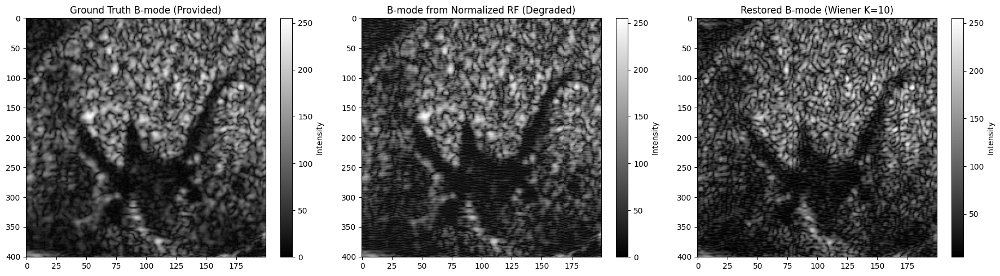

In [8]:
# Convert restored RF to B-mode
bmode_restored_wiener_k8 = rf_to_matched_bmode(restored_rf_vivo_norm_wiener, bmode_vivo)

# Convert original normalized RF to B-mode (degraded version)
bmode_degraded = rf_to_matched_bmode(rf_vivo_norm_signed, bmode_vivo)

# Plot all three: GT B-mode, degraded, restored
plt.figure(figsize=(18, 5))

# Provided GT B-mode
plt.subplot(1, 3, 1)
plt.imshow(bmode_vivo, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode (Provided)")
plt.colorbar(label='Intensity')

# Degraded B-mode from normalized RF
plt.subplot(1, 3, 2)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized RF (Degraded)")
plt.colorbar(label='Intensity')

# Restored B-mode (Wiener K=8)
plt.subplot(1, 3, 3)
plt.imshow(bmode_restored_wiener_k8, cmap='gray', aspect='auto')
plt.title("Restored B-mode (Wiener K=10)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


In [9]:
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# Ground truth RF and B-mode
rf_gt = rf_vivo
bmode_gt = bmode_vivo.astype(np.float32)

# Normalize restored RF and degraded RF to match GT scale for fair comparison
def normalize_like_ref(x, ref):
    x_min, x_max = np.percentile(ref, [0.5, 99.5])
    return np.clip((x - np.min(x)) / (np.max(x) - np.min(x) + 1e-8), 0, 1) * (x_max - x_min) + x_min

rf_restored_norm = normalize_like_ref(restored_rf_vivo_norm_wiener, rf_gt)
rf_degraded_norm = normalize_like_ref(rf_vivo_norm_signed, rf_gt)

# Compute metrics for RF
psnr_rf = psnr(rf_gt, rf_restored_norm, data_range=rf_gt.max() - rf_gt.min())
ssim_rf = ssim(rf_gt, rf_restored_norm, data_range=rf_gt.max() - rf_gt.min())

# Compute metrics for B-mode
bmode_restored = bmode_restored_wiener_k8.astype(np.float32)
bmode_degraded = bmode_degraded.astype(np.float32)

psnr_bmode = psnr(bmode_gt, bmode_restored, data_range=255)
ssim_bmode = ssim(bmode_gt, bmode_restored, data_range=255)

{
    "RF PSNR (dB)": round(psnr_rf, 2),
    "RF SSIM": round(ssim_rf, 4),
    "B-mode PSNR (dB)": round(psnr_bmode, 2),
    "B-mode SSIM": round(ssim_bmode, 4)
}


{'RF PSNR (dB)': 21.76,
 'RF SSIM': 0.1248,
 'B-mode PSNR (dB)': 18.92,
 'B-mode SSIM': 0.5375}

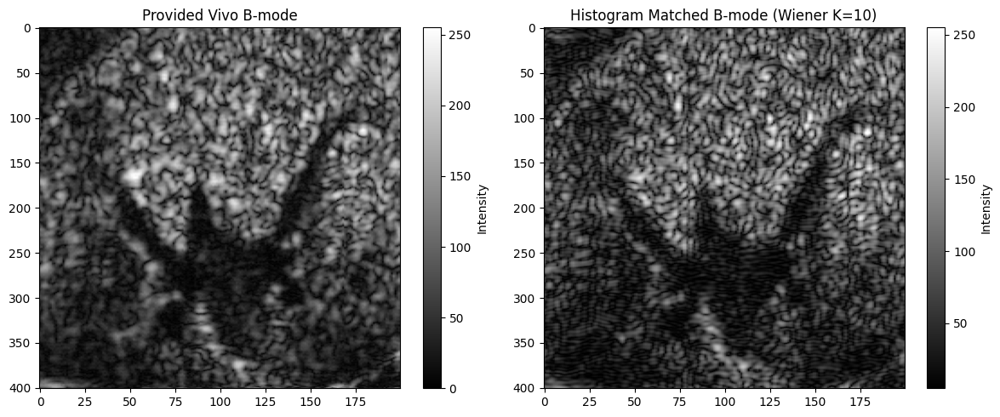

In [10]:
# Run Wiener deconvolution with K=10
restored_rf_vivo_norm_wiener = wiener_deconvolution(rf_vivo_norm_signed, psf_vivo, K=10)

# Convert restored RF to B-mode
bmode_restored_vivo_norm = rf_to_matched_bmode(restored_rf_vivo_norm_wiener, bmode_vivo)

# Visualize both original and restored B-mode images
plt.figure(figsize=(12, 5))

# Provided B-mode
plt.subplot(1, 2, 1)
plt.imshow(bmode_vivo, cmap='gray', aspect='auto')
plt.title("Provided Vivo B-mode")
plt.colorbar(label='Intensity')

# B-mode from Wiener-restored normalized RF
plt.subplot(1, 2, 2)
plt.imshow(bmode_restored_vivo_norm, cmap='gray', aspect='auto')
plt.title("Histogram Matched B-mode (Wiener K=10)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


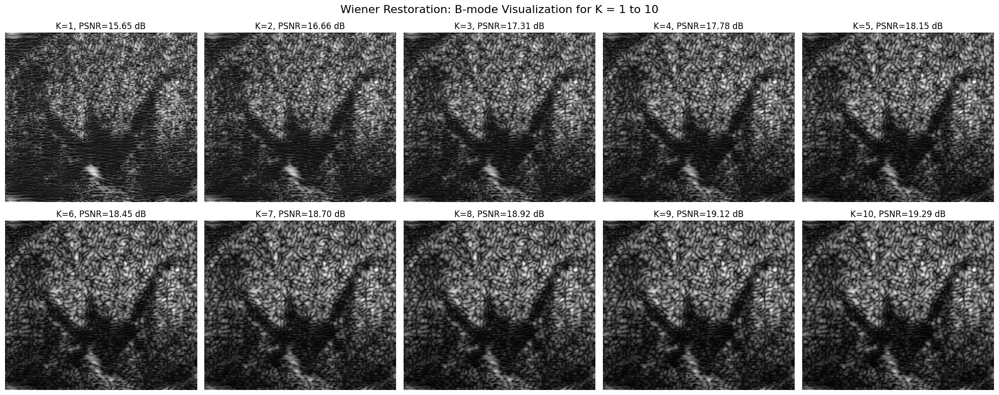

{'K=1': 15.65, 'K=2': 16.66, 'K=3': 17.31, 'K=4': 17.78, 'K=5': 18.15, 'K=6': 18.45, 'K=7': 18.7, 'K=8': 18.92, 'K=9': 19.12, 'K=10': 19.29}


In [11]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio as psnr

# --- B-mode conversion with histogram matching ---
def rf_to_matched_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --- Wiener deconvolution ---
def wiener_deconvolution(y, psf, K=0.01):
    H, W = y.shape
    Mh, Nh = psf.shape
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# --- Run for K = 1 to 10 ---
psnr_results = []

plt.figure(figsize=(20, 8))
for i, K in enumerate(range(1, 11), 1):
    restored_rf = wiener_deconvolution(rf_vivo_norm_signed, psf_vivo, K=K)
    restored_bmode = rf_to_matched_bmode(restored_rf, bmode_vivo)
    
    # Compute PSNR
    psnr_b = psnr(bmode_vivo.astype(np.float32), restored_bmode.astype(np.float32), data_range=255)
    psnr_results.append(round(psnr_b, 2))
    
    # Plot
    plt.subplot(2, 5, i)
    plt.imshow(restored_bmode, cmap='gray', aspect='auto')
    plt.title(f"K={K}, PSNR={psnr_b:.2f} dB")
    plt.axis('off')

plt.suptitle("Wiener Restoration: B-mode Visualization for K = 1 to 10", fontsize=16)
plt.tight_layout()
plt.show()

# --- Print PSNR values ---
print({f"K={k}": psnr for k, psnr in zip(range(1, 11), psnr_results)})


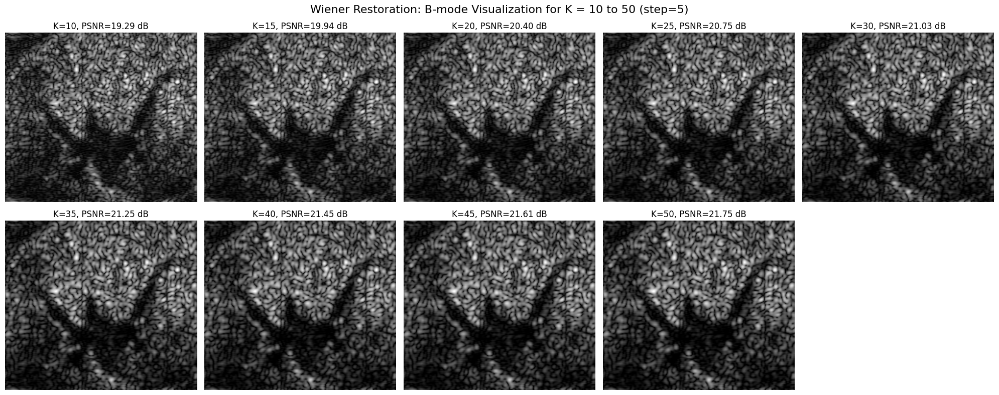

{'K=10': 19.29, 'K=15': 19.94, 'K=20': 20.4, 'K=25': 20.75, 'K=30': 21.03, 'K=35': 21.25, 'K=40': 21.45, 'K=45': 21.61, 'K=50': 21.75}


In [12]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio as psnr

# --- B-mode conversion with histogram matching ---
def rf_to_matched_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --- Wiener deconvolution ---
def wiener_deconvolution(y, psf, K=0.01):
    H, W = y.shape
    Mh, Nh = psf.shape
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# --- Run for K = 10 to 50 in steps of 5 ---
K_values = list(range(10, 55, 5))
psnr_results = []

plt.figure(figsize=(20, 8))
for i, K in enumerate(K_values, 1):
    restored_rf = wiener_deconvolution(rf_vivo_norm_signed, psf_vivo, K=K)
    restored_bmode = rf_to_matched_bmode(restored_rf, bmode_vivo)

    # Compute PSNR
    psnr_b = psnr(bmode_vivo.astype(np.float32), restored_bmode.astype(np.float32), data_range=255)
    psnr_results.append(round(psnr_b, 2))

    # Plot
    plt.subplot(2, 5, i)
    plt.imshow(restored_bmode, cmap='gray', aspect='auto')
    plt.title(f"K={K}, PSNR={psnr_b:.2f} dB")
    plt.axis('off')

plt.suptitle("Wiener Restoration: B-mode Visualization for K = 10 to 50 (step=5)", fontsize=16)
plt.tight_layout()
plt.show()

# --- Print PSNR values ---
print({f"K={k}": psnr for k, psnr in zip(K_values, psnr_results)})


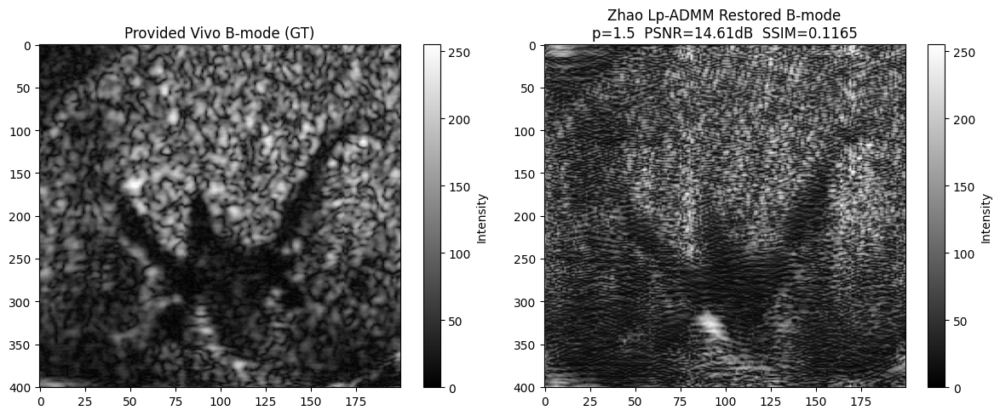

In [13]:
import numpy as np
from numpy.fft import fft2, ifft2
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import matplotlib.pyplot as plt

# --- Zhao Lp-ADMM implementation (from user) ---
def prox_lp(v, p, lam):
    eps = 1e-8
    return np.sign(v) * np.maximum(np.abs(v) - lam * p * np.abs(v + eps)**(p - 1), 0)

def pad_and_fft_psf(psf, shape):
    Mh, Nh = psf.shape
    H, W = shape
    padded_psf = np.zeros((H, W), dtype=np.float32)
    padded_psf[:Mh, :Nh] = psf
    centered = np.roll(np.roll(padded_psf, -Mh // 2, axis=0), -Nh // 2, axis=1)
    H_fft = fft2(centered)
    return H_fft

def zhao_lp_admm(y, psf, lam=0.05, rho=0.5, p=1.5, max_iter=50):
    H_fft = pad_and_fft_psf(psf, y.shape)
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft)**2
    Y_fft = fft2(y)

    x = np.copy(y)
    z = np.copy(y)
    u = np.zeros_like(y)

    for _ in range(max_iter):
        rhs = Y_fft + rho * fft2(z - u)
        x_fft = (H_conj * rhs) / (H_abs2 + rho)
        x = np.real(ifft2(x_fft))
        z = prox_lp(x + u, p, lam / rho)
        u = u + x - z

    return z

# --- Helper: RF to histogram-matched B-mode ---
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# --- Run Zhao restoration ---
restored_rf_admm = zhao_lp_admm(rf_vivo_norm_signed, psf_vivo, lam=0.05, rho=0.5, p=1.33, max_iter=300)

# Convert to B-mode
bmode_restored_admm = rf_to_matched_bmode(restored_rf_admm, bmode_vivo).astype(np.float32)

# Metrics
bmode_gt = bmode_vivo.astype(np.float32)
psnr_bmode = psnr(bmode_gt, bmode_restored_admm, data_range=255)
ssim_bmode = ssim(bmode_gt, bmode_restored_admm, data_range=255)

# Visualize GT vs Zhao restored
plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plt.imshow(bmode_gt, cmap='gray', aspect='auto')
plt.title("Provided Vivo B-mode (GT)")
plt.colorbar(label='Intensity')

plt.subplot(1,2,2)
plt.imshow(bmode_restored_admm, cmap='gray', aspect='auto')
plt.title(f"Zhao Lp-ADMM Restored B-mode\np=1.5  PSNR={psnr_bmode:.2f}dB  SSIM={ssim_bmode:.4f}")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


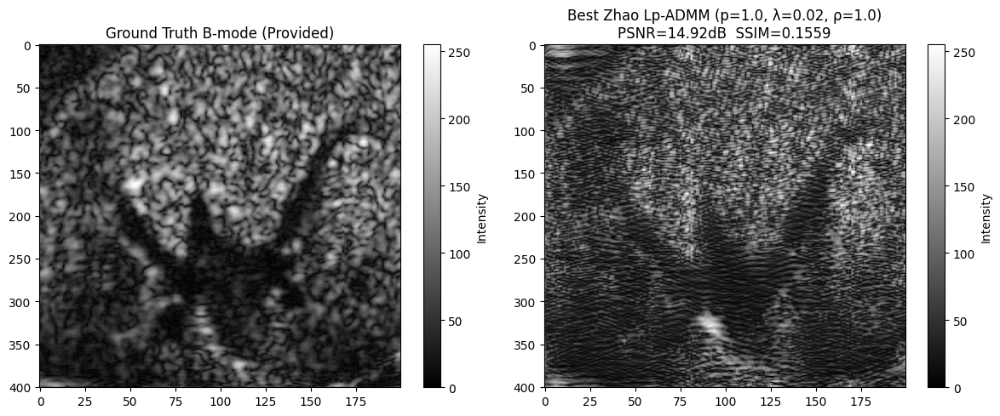

In [14]:
# Run Zhao Lp-ADMM with best params
restored_rf_best_zhao = zhao_lp_admm(rf_vivo_norm_signed, psf_vivo, lam=0.02, rho=1.0, p=1.0, max_iter=100)

# Convert to B-mode and histogram match
bmode_best_zhao = rf_to_matched_bmode(restored_rf_best_zhao, bmode_vivo).astype(np.float32)

# Compute metrics
psnr_best_zhao = psnr(bmode_gt, bmode_best_zhao, data_range=255)
ssim_best_zhao = ssim(bmode_gt, bmode_best_zhao, data_range=255)

# Plot GT vs Best Zhao result
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(bmode_gt, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode (Provided)")
plt.colorbar(label='Intensity')

plt.subplot(1, 2, 2)
plt.imshow(bmode_best_zhao, cmap='gray', aspect='auto')
plt.title(f"Best Zhao Lp-ADMM (p=1.0, λ=0.02, ρ=1.0)\nPSNR={psnr_best_zhao:.2f}dB  SSIM={ssim_best_zhao:.4f}")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


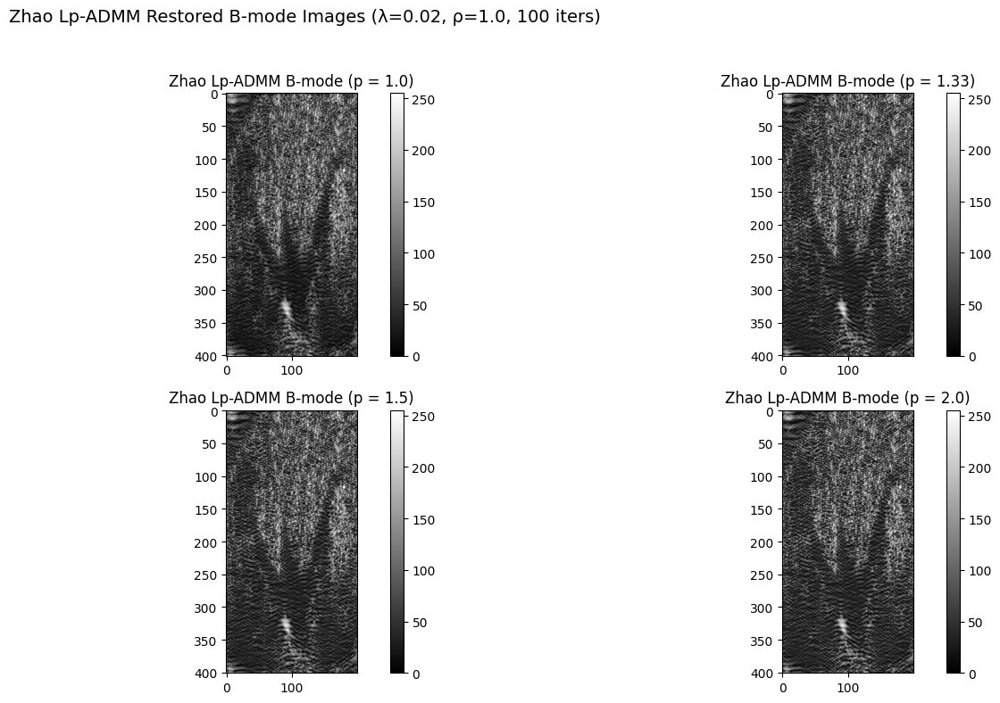

In [15]:
# Re-run B-mode generation for p=1.0 to ensure all visualizations use the same method
p_all = [1.0, 1.33, 1.5, 2.0]
bmode_zhao_all = []

for p_val in p_all:
    rf_restored = zhao_lp_admm(rf_vivo_norm_signed, psf_vivo, lam=0.02, rho=1.0, p=p_val, max_iter=100)
    bmode_restored = rf_to_matched_bmode(rf_restored, bmode_vivo).astype(np.float32)
    bmode_zhao_all.append((p_val, bmode_restored))

# Plot side-by-side
plt.figure(figsize=(16, 8))

for i, (p_val, bmode_img) in enumerate(bmode_zhao_all):
    ax = plt.subplot(2, 2, i + 1)
    ax.imshow(bmode_img, cmap='gray', aspect='equal')
    ax.set_title(f"Zhao Lp-ADMM B-mode (p = {p_val})")
    plt.colorbar(ax.images[0], ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("Zhao Lp-ADMM Restored B-mode Images (λ=0.02, ρ=1.0, 100 iters)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()


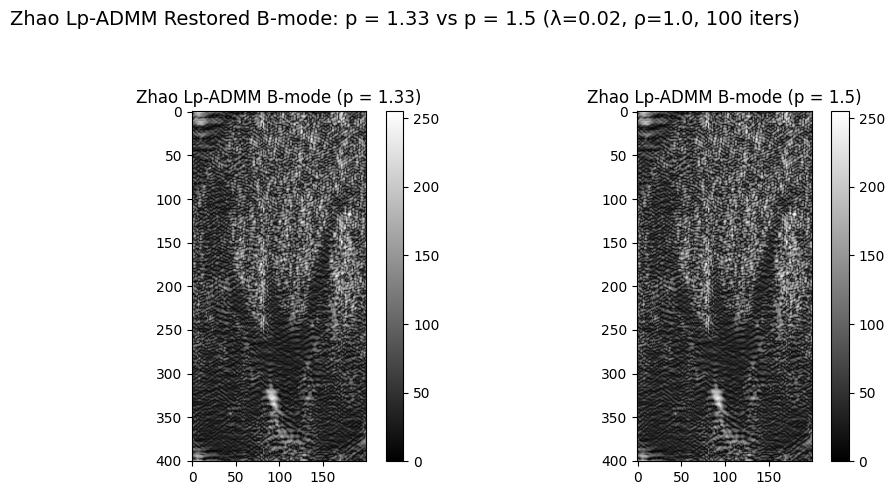

In [16]:
# Visualize side-by-side comparison of p=1.33 and p=1.5
selected_ps = [1.33, 1.5]
bmode_selected = []

for p_val in selected_ps:
    rf_restored = zhao_lp_admm(rf_vivo_norm_signed, psf_vivo, lam=0.02, rho=1.0, p=p_val, max_iter=100)
    bmode_restored = rf_to_matched_bmode(rf_restored, bmode_vivo).astype(np.float32)
    bmode_selected.append((p_val, bmode_restored))

# Plot
plt.figure(figsize=(10, 5))

for i, (p_val, bmode_img) in enumerate(bmode_selected):
    ax = plt.subplot(1, 2, i + 1)
    ax.imshow(bmode_img, cmap='gray', aspect='equal')
    ax.set_title(f"Zhao Lp-ADMM B-mode (p = {p_val})")
    plt.colorbar(ax.images[0], ax=ax, fraction=0.046, pad=0.04)

plt.suptitle("Zhao Lp-ADMM Restored B-mode: p = 1.33 vs p = 1.5 (λ=0.02, ρ=1.0, 100 iters)", fontsize=14)
plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


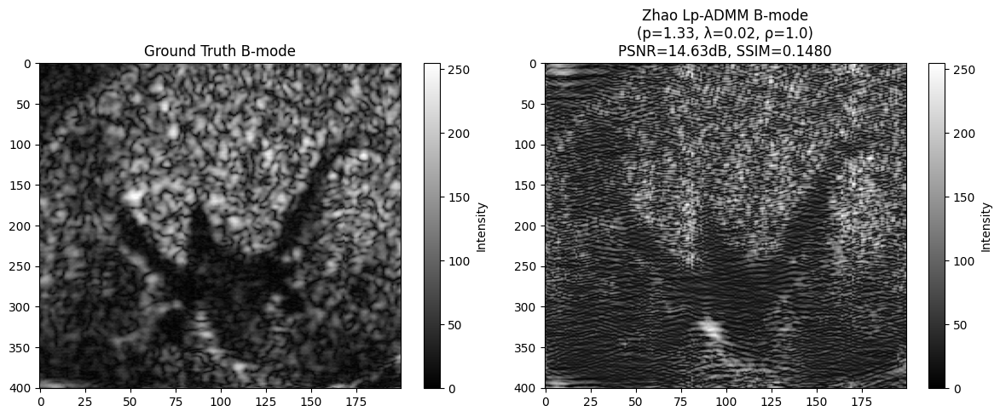

In [17]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from numpy.fft import fft2, ifft2
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# === Load the dataset ===
vivo_path = 'exp/datasets/anes_data/vivo/data.mat'
vivo_data = scipy.io.loadmat(vivo_path)

rf_vivo = vivo_data["rf"]
bmode_vivo = vivo_data["bmode"]
psf_vivo = vivo_data["PSF_estim"]

# === Normalize RF to [-1, 1] ===
rf_min, rf_max = rf_vivo.min(), rf_vivo.max()
rf_vivo_norm_signed = 2 * ((rf_vivo - rf_min) / (rf_max - rf_min + 1e-8)) - 1

# === Zhao Lp-ADMM Functions ===
def prox_lp(v, p, lam):
    eps = 1e-8
    return np.sign(v) * np.maximum(np.abs(v) - lam * p * np.abs(v + eps)**(p - 1), 0)

def pad_and_fft_psf(psf, shape):
    Mh, Nh = psf.shape
    H, W = shape
    padded_psf = np.zeros((H, W), dtype=np.float32)
    padded_psf[:Mh, :Nh] = psf
    centered = np.roll(np.roll(padded_psf, -Mh // 2, axis=0), -Nh // 2, axis=1)
    return fft2(centered)

def zhao_lp_admm(y, psf, lam=0.05, rho=0.5, p=1.5, max_iter=100):
    H_fft = pad_and_fft_psf(psf, y.shape)
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    Y_fft = fft2(y)

    x = np.copy(y)
    z = np.copy(y)
    u = np.zeros_like(y)

    for _ in range(max_iter):
        rhs = Y_fft + rho * fft2(z - u)
        x_fft = (H_conj * rhs) / (H_abs2 + rho)
        x = np.real(ifft2(x_fft))
        z = prox_lp(x + u, p, lam / rho)
        u = u + x - z

    return z

# === RF to B-mode conversion with histogram matching ===
def rf_to_matched_bmode(RF: np.ndarray, GT_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = GT_bmode[:, :, 0] if GT_bmode.ndim == 3 else GT_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

# === Run Zhao Lp-ADMM with your desired parameters ===
# Change these parameters as needed
lam = 0.02
rho = 1.0
p_val = 1.33
iters = 200

restored_rf = zhao_lp_admm(rf_vivo_norm_signed, psf_vivo, lam=lam, rho=rho, p=p_val, max_iter=iters)
bmode_restored = rf_to_matched_bmode(restored_rf, bmode_vivo).astype(np.float32)

# === Compute metrics ===
bmode_gt = bmode_vivo.astype(np.float32)
psnr_val = psnr(bmode_gt, bmode_restored, data_range=255)
ssim_val = ssim(bmode_gt, bmode_restored, data_range=255)

# === Visualize ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(bmode_gt, cmap='gray', aspect='auto')
plt.title("Ground Truth B-mode")
plt.colorbar(label='Intensity')

plt.subplot(1, 2, 2)
plt.imshow(bmode_restored, cmap='gray', aspect='auto')
plt.title(f"Zhao Lp-ADMM B-mode\n(p={p_val}, λ={lam}, ρ={rho})\nPSNR={psnr_val:.2f}dB, SSIM={ssim_val:.4f}")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


In [18]:
def normalize_rf(rf: np.ndarray, min_val: float = -1.0, max_val: float = 1.0) -> np.ndarray:
    """
    Normalize RF data to a specified range [min_val, max_val].

    Parameters:
        rf (np.ndarray): Input RF data.
        min_val (float): Minimum value of the target range (default: -1.0).
        max_val (float): Maximum value of the target range (default: 1.0).

    Returns:
        np.ndarray: Normalized RF data.
    """
    rf_min, rf_max = rf.min(), rf.max()
    norm = (rf - rf_min) / (rf_max - rf_min + 1e-8)  # avoid division by zero
    scaled = norm * (max_val - min_val) + min_val
    return scaled


In [19]:
import numpy as np

def resize_rf_to_512(input_rf):
    """
    Resize 401x200 RF to 512x512 using symmetry-based padding for DDRM.
    """
    H, W = input_rf.shape
    assert H == 401 and W == 200, "Expected shape (401, 200)"

    # Initialize 512x512 array
    data = np.zeros((512, 512), dtype=input_rf.dtype)

    # 1. Original
    data[0:401, 0:200] = input_rf

    # 2. Horizontal flip
    data[0:401, 200:400] = np.fliplr(input_rf)

    # 3. Horizontal extension
    data[0:401, 400:] = input_rf[:, :112]

    # 4. Vertical flip
    temp = data[290:401, :]    # MATLAB's 291:401 → Python's 290:401
    data[401:, :] = np.flipud(temp)

    return data



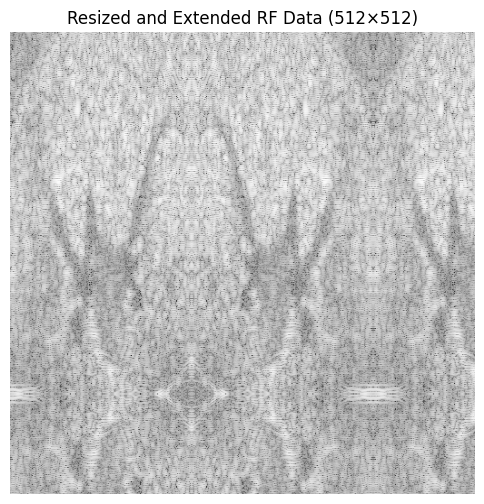

In [20]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file (adjust the path as needed)
mat_path = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(mat_path)

# Extract RF data (shape should be [401, 200])
rf = data['rf']

# --- MATLAB-style resizing and mirroring ---
data2 = rf.copy()  # (401, 200)
result = np.zeros((512, 512), dtype=rf.dtype)

# Fill left: original RF
result[:401, :200] = data2

# Fill middle: horizontally flipped RF
result[:401, 200:400] = np.fliplr(data2)

# Fill right: first 112 columns of RF
result[:401, 400:] = data2[:, :112]

# Bottom rows: mirror flip of rows 291:401
temp = result[290:401, :]
result[401:, :] = np.flipud(temp)

# --- Visualize in log-compressed scale ---
plt.figure(figsize=(6, 6))
plt.imshow(20 * np.log10(np.abs(result) + 1e-6), cmap='gray', aspect='auto')
plt.title("Resized and Extended RF Data (512×512)")
plt.axis('off')
plt.show()


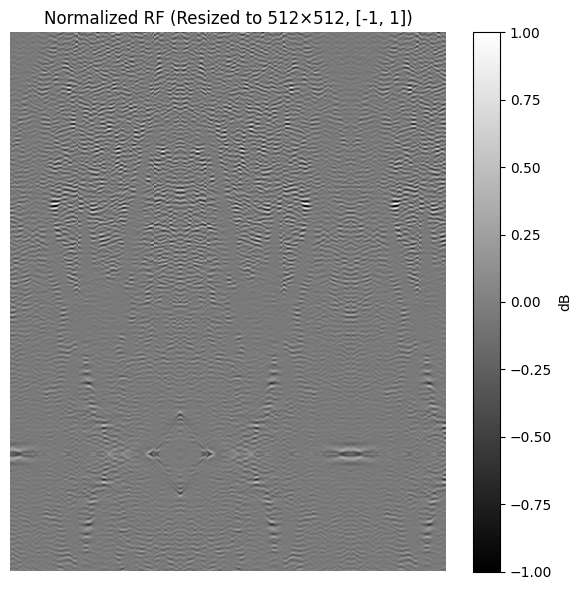

In [21]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# Load the .mat file
mat_path = "exp/datasets/anes_data/vivo/data.mat"
data = scipy.io.loadmat(mat_path)

# Extract RF data
rf = data['rf']  # shape: (401, 200)

# --- MATLAB-style resizing and mirroring ---
data2 = rf.copy()
result = np.zeros((512, 512), dtype=rf.dtype)

# Fill left: original RF
result[:401, :200] = data2

# Fill middle: horizontally flipped RF
result[:401, 200:400] = np.fliplr(data2)

# Fill right: first 112 columns of RF
result[:401, 400:] = data2[:, :112]

# Bottom rows: mirror flip of rows 291:401
temp = result[290:401, :]
result[401:, :] = np.flipud(temp)

# --- Normalize to [-1, 1] ---
rf_min, rf_max = result.min(), result.max()
result_norm = 2 * ((result - rf_min) / (rf_max - rf_min + 1e-8)) - 1

# --- Visualize log-compressed normalized RF ---
plt.figure(figsize=(6, 6))
plt.imshow(result_norm, cmap='gray', aspect='auto')
plt.title("Normalized RF (Resized to 512×512, [-1, 1])")
plt.axis('off')
plt.colorbar(label='dB')
plt.tight_layout()
plt.show()


In [22]:
import os
import scipy.io

# Create the directory if it doesn't exist
save_dir = "input/vivo/ddrm"
os.makedirs(save_dir, exist_ok=True)

# Save the normalized RF to a .mat file
save_path = os.path.join(save_dir, "normalized_rf.mat")
scipy.io.savemat(save_path, {"normalized_rf": result_norm})

print(f"Normalized RF saved to: {save_path}")


Normalized RF saved to: input/vivo/ddrm/normalized_rf.mat


### normalized_rf.mat = input to my DDRM model 

In [1]:
def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)
    
# Apply conversion
bmode_resized = rf_to_matched_bmode(result_norm, bmode_vivo)

# --- Visualize the B-mode ---
plt.figure(figsize=(6, 6))
plt.imshow(bmode_resized, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized Resized RF")
plt.axis('off')
plt.colorbar(label='Intensity')
plt.tight_layout()
plt.show()


NameError: name 'np' is not defined

In [24]:
import os
import scipy.io

# Create the directory if it doesn't exist
save_dir = "input/vivo/ddrm"
os.makedirs(save_dir, exist_ok=True)

# Save the normalized RF to a .mat file
save_path = os.path.join(save_dir, "bmode_512.mat")
scipy.io.savemat(save_path, {"bmode_512": bmode_resized})

print(f"Bmode resized to 512 is saved: {save_path}")


Bmode resized to 512 is saved: input/vivo/ddrm/bmode_512.mat


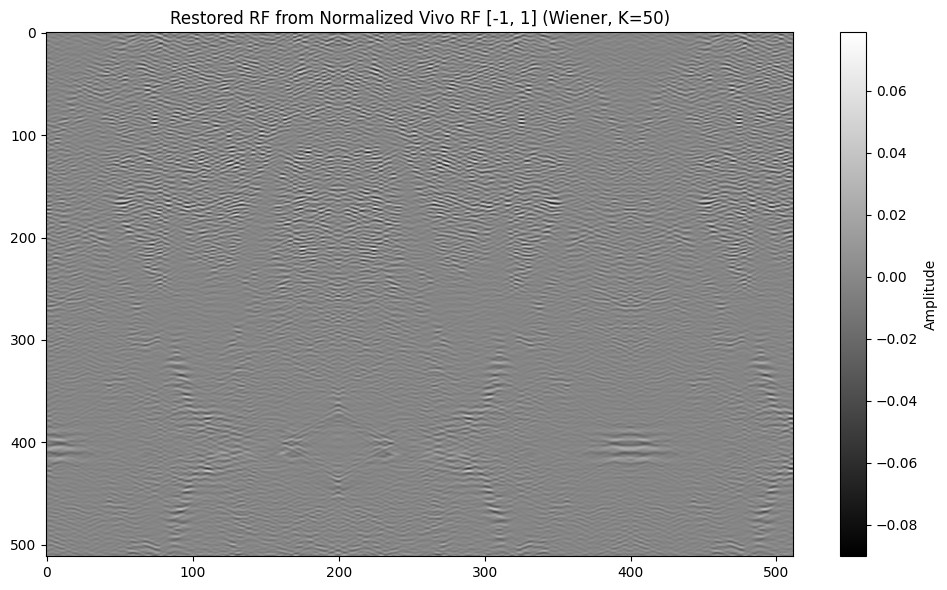

In [25]:
# Define and run Wiener deconvolution with K = 8 on normalized RF
def wiener_deconvolution(y: np.ndarray, psf: np.ndarray, K: float = 0.01) -> np.ndarray:
    H, W = y.shape
    Mh, Nh = psf.shape

    # Zero-pad and center PSF
    padded = np.zeros((H, W), dtype=np.float32)
    padded[:Mh, :Nh] = psf
    center = (Mh // 2, Nh // 2)
    shifted = np.roll(np.roll(padded, -center[0], axis=0), -center[1], axis=1)

    # FFTs
    H_fft = np.fft.fft2(shifted)
    Y_fft = np.fft.fft2(y)

    # Wiener filter
    H_conj = np.conj(H_fft)
    H_abs2 = np.abs(H_fft) ** 2
    X_hat = (H_conj / (H_abs2 + K)) * Y_fft

    # Inverse FFT
    x_restored = np.real(np.fft.ifft2(X_hat))
    return x_restored

# Apply Wiener deconvolution with K = 8
restored_rf_vivo_norm_wiener = wiener_deconvolution(result_norm, psf_vivo, K=10)

# Visualize the restored RF
plt.figure(figsize=(10, 6))
plt.imshow(restored_rf_vivo_norm_wiener, cmap='gray', aspect='auto')
plt.title("Restored RF from Normalized Vivo RF [-1, 1] (Wiener, K=50)")
plt.colorbar(label='Amplitude')
plt.tight_layout()
plt.show()


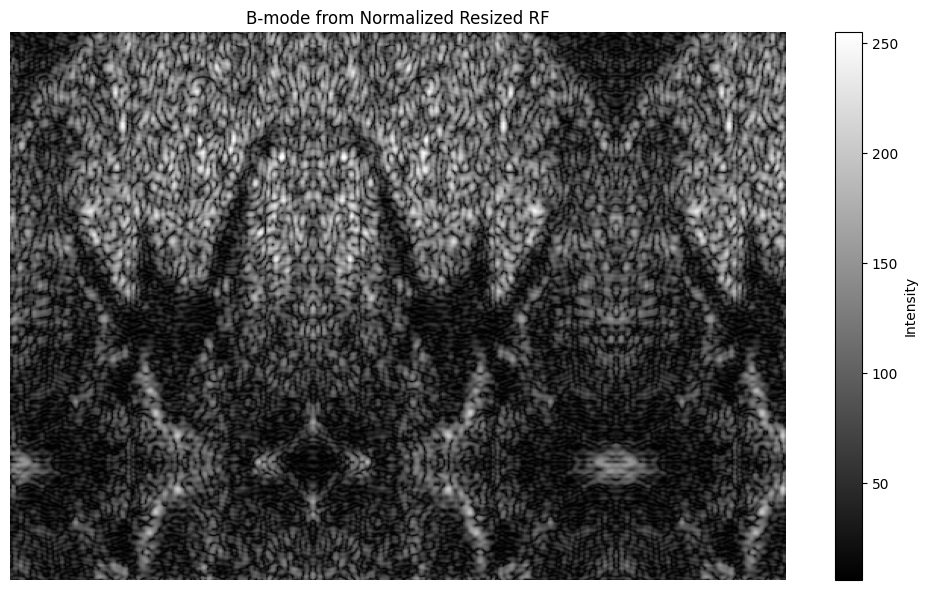

In [26]:
# Apply conversion
bmode_resized = rf_to_matched_bmode(restored_rf_vivo_norm_wiener, bmode_vivo)

# --- Visualize the B-mode ---
plt.figure(figsize=(10, 6))
plt.imshow(bmode_resized, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized Resized RF")
plt.axis('off')
plt.colorbar(label='Intensity')
plt.tight_layout()
plt.show()


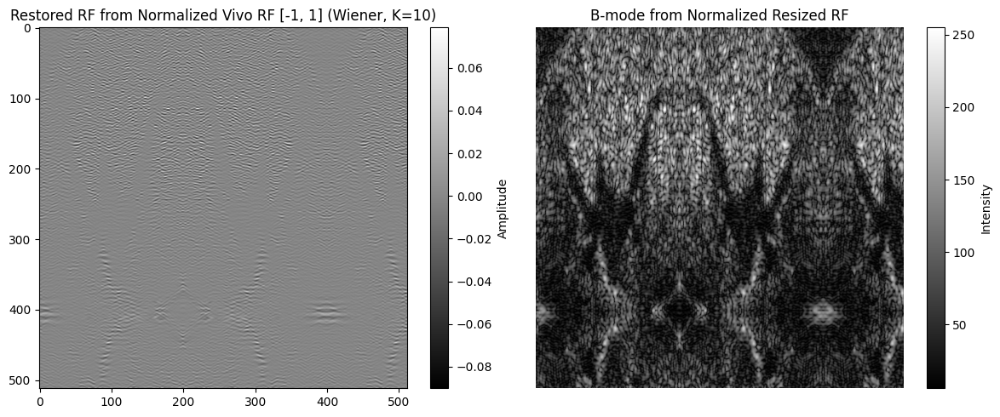

In [27]:
# === Visualize ===
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(restored_rf_vivo_norm_wiener, cmap='gray', aspect='auto')
plt.title("Restored RF from Normalized Vivo RF [-1, 1] (Wiener, K=10)")
plt.colorbar(label='Amplitude')


plt.subplot(1, 2, 2)
plt.imshow(bmode_resized, cmap='gray', aspect='auto')
plt.title("B-mode from Normalized Resized RF")
plt.axis('off')
plt.colorbar(label='Intensity')


plt.tight_layout()
plt.show()


In [28]:
import numpy as np
import scipy.io

# --- Normalize to [-1, 1] ---
rf = restored_rf_vivo_norm_wiener
rf_min, rf_max = rf.min(), rf.max()
rf_norm = 2 * ((rf - rf_min) / (rf_max - rf_min + 1e-8)) - 1



In [29]:
import os
import scipy.io

# Create the directory if it doesn't exist
save_dir = "input/vivo/ddrm"
os.makedirs(save_dir, exist_ok=True)

# Save the normalized RF to a .mat file
save_path = os.path.join(save_dir, "rf_GT_norm_512.mat")
scipy.io.savemat(save_path, {"rf_GT_norm_512": rf_norm})

print(f"RF normalized (512) served as GT is saved in : {save_path}")


RF normalized (512) served as GT is saved in : input/vivo/ddrm/rf_GT_norm_512.mat


In [86]:
!python main_vivo.py \
  --degraded_mat input/vivo/ddrm/normalized_rf.mat \
  --gt_mat       input/vivo/GT_rf_resized_512.mat \
  --psf_path     exp/datasets/anes_data/vivo/data.mat \
  --model_path   exp/logs/imagenet/512x512_diffusion.pt \
  --config       us512.yml \
  --timesteps    100 \
  --eta          0.95 \
  --etaB         1.0 \
  --sigma_0      0.02 \
  --output_dir   input/vivo/output


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
⚠️  'rf_degraded' not found in normalized_rf.mat; using 'normalized_rf'
RF shape: (512, 512)
INFO - main.py - 2025-05-22 17:17:12,488 - Using device: cuda
✅ Diffusion model loaded
✅ PSF operator and singulars ready
100it [00:58,  1.71it/s]
✅ Saved input/vivo/output/restored_ddrm.mat
PSNR: 18.45 dB   SSIM: -0.2183


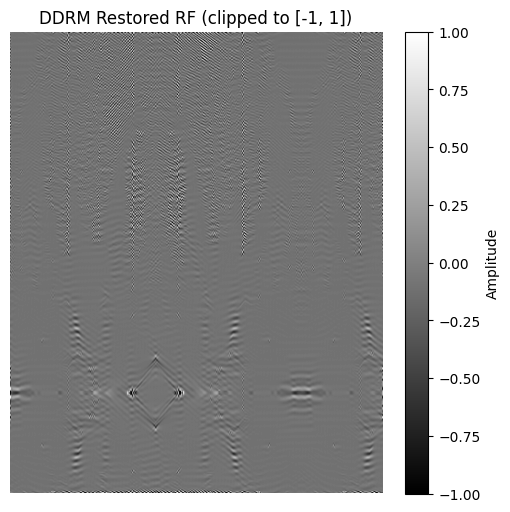

In [87]:
import scipy.io
import matplotlib.pyplot as plt
import numpy as np

# Load restored RF data
mat_path = "input/vivo/output/restored_ddrm.mat"
rf_rest = scipy.io.loadmat(mat_path)["rf_restored"].squeeze()

# Optionally clip to [-1, 1] so the display isn't dominated by outliers
rf_display = np.clip(rf_rest, -1.0, 1.0)

plt.figure(figsize=(6, 6))
plt.imshow(rf_display , cmap="gray", aspect="auto")
plt.title("DDRM Restored RF (clipped to [-1, 1])")
plt.colorbar(label="Amplitude")
plt.axis("off")
plt.show()


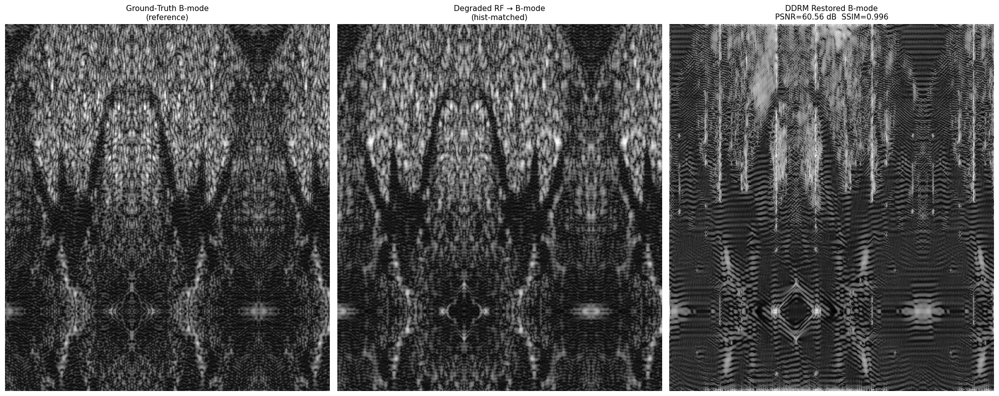

In [88]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms
from skimage.metrics import peak_signal_noise_ratio, structural_similarity

def rf_to_matched_bmode(RF: np.ndarray, ref_bmode: np.ndarray, increase: float = 1e-6) -> np.ndarray:
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= (255.0 / db.max())
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)
    

# ---------- load data ----------
rf_rest = scipy.io.loadmat("input/vivo/output/restored_ddrm.mat")["rf_restored"].squeeze()
rf_deg  = scipy.io.loadmat("input/vivo/normalized_rf.mat")["normalized_rf"].squeeze()
rf_gt   = scipy.io.loadmat("input/vivo/GT_rf_resized_512.mat")["GT_rf_resized"].squeeze()

# Clip restored to [-1,1] to avoid outliers
rf_rest = np.clip(rf_rest, -1.0, 1.0)

# Convert both original and normalized RF to B-mode
bmode_vivo_original = rf_to_matched_bmode(rf_gt, bmode_vivo)
bmode_vivo_degraded = rf_to_matched_bmode(rf_deg, bmode_vivo)
bmode_vivo_restored= rf_to_matched_bmode(rf_rest, bmode_vivo)

# Metrics on B‑mode
psnr_bm = peak_signal_noise_ratio(rf_gt, rf_rest, data_range=255)
ssim_bm = structural_similarity(rf_gt, rf_rest, data_range=255)

# ---------- plot ----------
plt.figure(figsize=(20,8))
titles = [
    "Ground‑Truth B‑mode\n(reference)",
    "Degraded RF → B‑mode\n(hist‑matched)",
    f"DDRM Restored B‑mode\nPSNR={psnr_bm:.2f} dB  SSIM={ssim_bm:.3f}"
]
for i, img in enumerate([bmode_vivo_original, bmode_vivo_degraded, bmode_vivo_restored], 1):
    plt.subplot(1, 3, i)
    plt.imshow(img, cmap="gray", aspect="auto")
    plt.axis("off")
    plt.title(titles[i-1], fontsize=11)
plt.tight_layout()
plt.show()


In [33]:
import scipy.io
import numpy as np

# Load original GT
mat = scipy.io.loadmat("input/vivo/ddrm/rf_GT_norm_512.mat")
rf_gt = mat["rf_GT_norm_512"]

# Save with expected key
scipy.io.savemat("input/vivo/ddrm/rf_GT_norm_512.mat", {"GT_rf_resized": rf_gt})


In [65]:
import scipy.io

# Load the uploaded DDRM input and surrogate GT
degraded_data = scipy.io.loadmat("input/vivo/ddrm/normalized_rf.mat")
gt_data = scipy.io.loadmat("input/vivo/ddrm/rf_GT_norm_512.mat")

# Find variable keys
degraded_key = [k for k in degraded_data if not k.startswith("__")][0]
gt_key = [k for k in gt_data if not k.startswith("__")][0]

# Extract arrays
rf_degraded = degraded_data[degraded_key]
rf_gt = gt_data[gt_key]

# Inspect shapes and ranges
input_summary = {
    "Degraded RF": {
        "shape": rf_degraded.shape,
        "min": float(rf_degraded.min()),
        "max": float(rf_degraded.max()),
        "mean": float(rf_degraded.mean()),
        "std": float(rf_degraded.std())
    },
    "Surrogate GT RF": {
        "shape": rf_gt.shape,
        "min": float(rf_gt.min()),
        "max": float(rf_gt.max()),
        "mean": float(rf_gt.mean()),
        "std": float(rf_gt.std())
    }
}

input_summary


{'Degraded RF': {'shape': (512, 512),
  'min': -1.0,
  'max': 0.99999999992,
  'mean': -0.0439537659073825,
  'std': 0.1368362008247114},
 'Surrogate GT RF': {'shape': (512, 512),
  'min': -1.0,
  'max': 0.999999881724035,
  'mean': 0.044787702807766575,
  'std': 0.13022609785512085}}

In [90]:
!python main_vivo.py \
  --degraded_mat input/vivo/ddrm/normalized_rf.mat \
  --gt_mat       input/vivo/ddrm/rf_GT_norm_512.mat \
  --psf_path     exp/datasets/anes_data/vivo/data.mat \
  --model_path   exp/logs/imagenet/512x512_diffusion.pt \
  --config       us512.yml \
  --timesteps    120 \
  --eta          0.95 \
  --etaB         1.0 \
  --sigma_0      0.015 \
  --output_dir   input/vivo/ddrm/output


Module path: /projects/minds/PDAS-M2-2025/DDPM
Current sys.path: ['/projects/minds/PDAS-M2-2025/MIRDDRM', '/usr/lib/python310.zip', '/usr/lib/python3.10', '/usr/lib/python3.10/lib-dynload', '/home/pdas/.local/lib/python3.10/site-packages', '/usr/local/lib/python3.10/dist-packages', '/usr/local/lib/python3.10/dist-packages/nvfuser-0.1.4a0+d0bb811-py3.10-linux-x86_64.egg', '/usr/lib/python3/dist-packages', '/projects/minds/PDAS-M2-2025/DDPM']
File not found: /projects/minds/PDAS-M2-2025/DDPM/denoising_diffusion_pytorch.py
Import failed: No module named 'denoising_diffusion_pytorch'
Using device: cuda
⚠️  'rf_degraded' not found in normalized_rf.mat; using 'normalized_rf'
RF shape: (512, 512)
INFO - main.py - 2025-05-22 17:20:18,631 - Using device: cuda
✅ Diffusion model loaded
✅ PSF operator and singulars ready
125it [01:10,  1.78it/s]
✅ Saved input/vivo/ddrm/output/restored_ddrm.mat
PSNR: 17.93 dB   SSIM: -0.2106


In [35]:
!ls input/vivo/ddrm/

bmode_512.mat  normalized_rf.mat  output  rf_GT_norm_512.mat


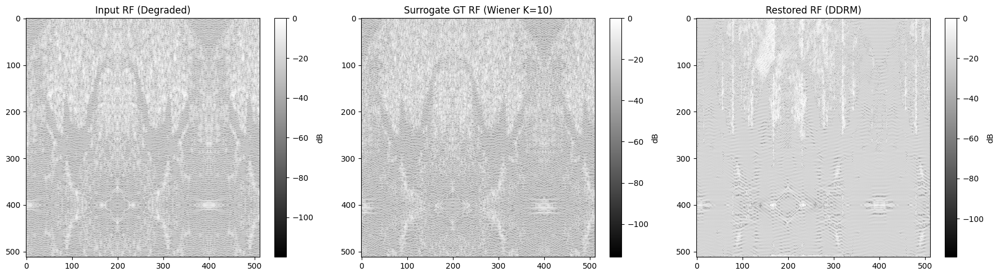

In [91]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt

# === Define normalization function ===
def normalize_rf(x):
    x_min, x_max = x.min(), x.max()
    return 2 * ((x - x_min) / (x_max - x_min + 1e-8)) - 1

# === Load all RFs ===
degraded = scipy.io.loadmat("input/vivo/ddrm/normalized_rf.mat")["normalized_rf"]
gt = scipy.io.loadmat("input/vivo/ddrm/rf_GT_norm_512.mat")["GT_rf_resized"]
restored = scipy.io.loadmat("input/vivo/ddrm/output/restored_ddrm.mat")["rf_restored"]

# === Normalize and clip for fairness ===
degraded = normalize_rf(degraded)
degraded = np.clip(degraded, -1.0, 1.0)
restored = np.clip(restored, -1.0, 1.0)  # Recommended to avoid outlier bias

# === Visualize in log-compressed scale ===
def log_compress(rf, eps=1e-6):
    return 20 * np.log10(np.abs(rf) + eps)

degraded_log = log_compress(degraded)
gt_log = log_compress(gt)
restored_log = log_compress(restored)

# === Plot ===
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(degraded_log, cmap='gray', aspect='auto')
plt.title("Input RF (Degraded)")
plt.colorbar(label='dB')

plt.subplot(1, 3, 2)
plt.imshow(gt_log, cmap='gray', aspect='auto')
plt.title("Surrogate GT RF (Wiener K=10)")
plt.colorbar(label='dB')

plt.subplot(1, 3, 3)
plt.imshow(restored_log, cmap='gray', aspect='auto')
plt.title("Restored RF (DDRM)")
plt.colorbar(label='dB')

plt.tight_layout()
plt.show()


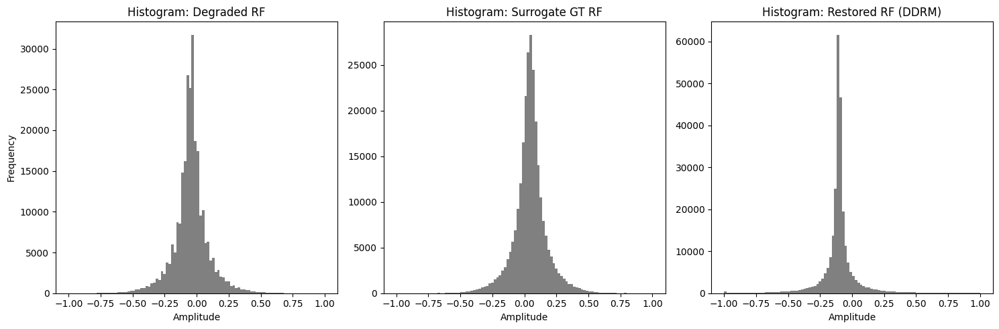

{'Degraded RF': (-1.0, 0.9999999900000001),
 'Surrogate GT RF': (-1.0, 0.999999881724035),
 'Restored RF': (-1.0, 1.0)}

In [92]:
# Compute value ranges
ranges = {
    "Degraded RF": (degraded.min(), degraded.max()),
    "Surrogate GT RF": (gt.min(), gt.max()),
    "Restored RF": (restored.min(), restored.max())
}

# Plot histograms
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.hist(degraded.flatten(), bins=100, color='gray')
plt.title("Histogram: Degraded RF")
plt.xlabel("Amplitude")
plt.ylabel("Frequency")

plt.subplot(1, 3, 2)
plt.hist(gt.flatten(), bins=100, color='gray')
plt.title("Histogram: Surrogate GT RF")
plt.xlabel("Amplitude")

plt.subplot(1, 3, 3)
plt.hist(restored.flatten(), bins=100, color='gray')
plt.title("Histogram: Restored RF (DDRM)")
plt.xlabel("Amplitude")

plt.tight_layout()
plt.show()

ranges


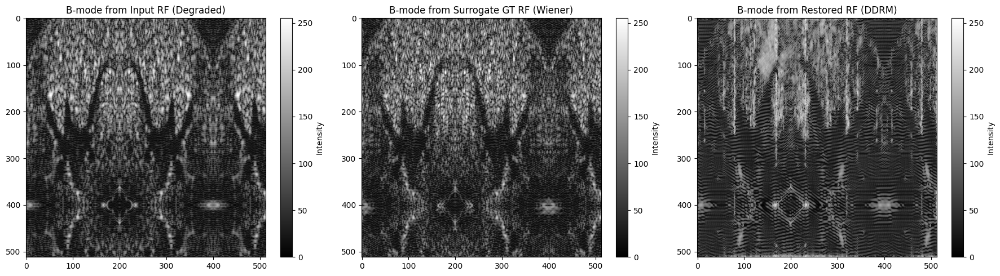

In [93]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# === Load RF data ===
rf_degraded = scipy.io.loadmat("input/vivo/ddrm/normalized_rf.mat")["normalized_rf"]
rf_gt = scipy.io.loadmat("input/vivo/ddrm/rf_GT_norm_512.mat")["GT_rf_resized"]
rf_restored = scipy.io.loadmat("input/vivo/ddrm/output/restored_ddrm.mat")["rf_restored"]



# === Convert RF to B-mode ===
def rf_to_matched_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db = 20.0 * np.log10(env + increase)
    db = np.clip(db, a_min=-60, a_max=None)
    db -= db.min()
    db *= 255.0 / db.max()
    ref = ref_bmode[:, :, 0] if ref_bmode.ndim == 3 else ref_bmode
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

bmode_degraded = rf_to_matched_bmode(rf_degraded, bmode_vivo)
bmode_gt = rf_to_matched_bmode(rf_gt, bmode_vivo)
bmode_restored = rf_to_matched_bmode(rf_restored, bmode_vivo)

# === Plot B-mode images ===
plt.figure(figsize=(18, 5))

plt.subplot(1, 3, 1)
plt.imshow(bmode_degraded, cmap='gray', aspect='auto')
plt.title("B-mode from Input RF (Degraded)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 2)
plt.imshow(bmode_gt, cmap='gray', aspect='auto')
plt.title("B-mode from Surrogate GT RF (Wiener)")
plt.colorbar(label='Intensity')

plt.subplot(1, 3, 3)
plt.imshow(bmode_restored, cmap='gray', aspect='auto')
plt.title("B-mode from Restored RF (DDRM)")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


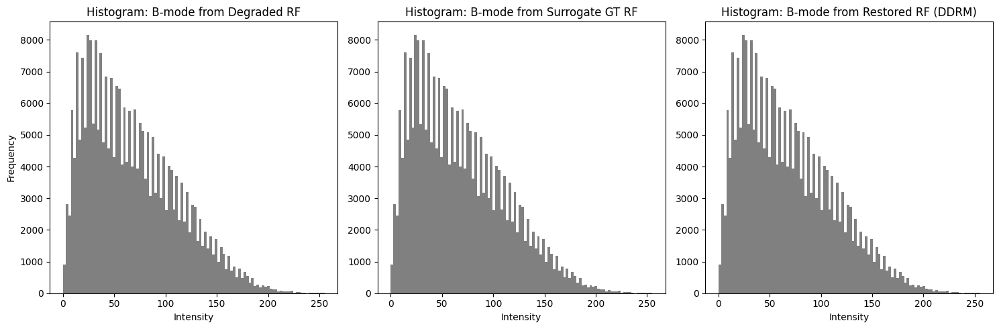

In [94]:
# Plot histograms for B-mode images
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.hist(bmode_degraded.flatten(), bins=100, color='gray')
plt.title("Histogram: B-mode from Degraded RF")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.subplot(1, 3, 2)
plt.hist(bmode_gt.flatten(), bins=100, color='gray')
plt.title("Histogram: B-mode from Surrogate GT RF")
plt.xlabel("Intensity")

plt.subplot(1, 3, 3)
plt.hist(bmode_restored.flatten(), bins=100, color='gray')
plt.title("Histogram: B-mode from Restored RF (DDRM)")
plt.xlabel("Intensity")

plt.tight_layout()
plt.show()


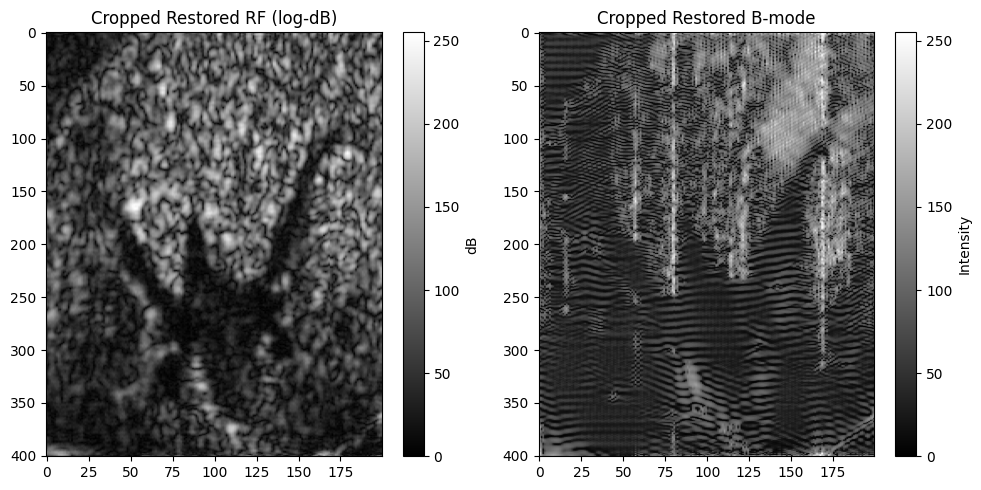

In [96]:
import numpy as np
import scipy.io
import matplotlib.pyplot as plt
from scipy.signal import hilbert
from skimage.exposure import match_histograms

# --- Load restored DDRM RF and original bmode reference ---
rf_512     = scipy.io.loadmat("input/vivo/ddrm/output/restored_ddrm.mat")["rf_restored"]
bmode_vivo = scipy.io.loadmat("exp/datasets/anes_data/vivo/data.mat")["bmode"]

# --- Crop back to original RF size (401×200) ---
rf_cropped = rf_512[:401, :200]



# --- RF→B-mode conversion (matching bmode_vivo) ---
def rf_to_matched_bmode(RF, ref_bmode, increase=1e-6):
    env = np.abs(hilbert(RF, axis=0))
    db  = 20.0 * np.log10(env + increase)
    db  = np.clip(db, -60, None)
    db -= db.min()
    db *= 255.0 / db.max()
    # reference B-mode is 401×200 (or repeated channel)
    ref = ref_bmode if ref_bmode.ndim == 2 else ref_bmode[:, :, 0]
    matched = match_histograms(db, ref, channel_axis=None)
    return np.clip(matched, 0, 255).astype(np.uint8)

bmode_cropped = rf_to_matched_bmode(rf_cropped, bmode_vivo)

# --- Display side-by-side ---
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(bmode_vivo, cmap='gray', aspect='auto')
plt.title("Cropped Restored RF (log-dB)")
plt.colorbar(label='dB')

plt.subplot(1, 2, 2)
plt.imshow(bmode_cropped, cmap='gray', aspect='auto')
plt.title("Cropped Restored B-mode")
plt.colorbar(label='Intensity')

plt.tight_layout()
plt.show()


In [ ]:
!python main_vivo.py \
  --degraded_mat input/vivo/ddrm/normalized_rf.mat \
  --gt_mat       input/vivo/ddrm/rf_GT_norm_512.mat \
  --psf_path     exp/datasets/anes_data/vivo/data.mat \
  --model_path   exp/logs/imagenet/512x512_diffusion.pt \
  --config       us512.yml \
  --timesteps    100 \
  --eta          0.8 \
  --etaB         0.8 \
  --sigma_0      0.1 \
  --output_dir   input/vivo/ddrm/output/
